# niche pathway analysis - ALL 94 patients (280 subarrays)

**full-dataset version** of `niche_pathway_analysis.ipynb`. Same pipeline, scaled from 3-patient pilot (9 subarrays, 8.7k niches) to all 94 TNBC patients (~280 subarrays, ~270k niches). Results persisted to parquet after the Fisher EA so re-runs skip the expensive Rscript loop and hypergeom loop.

per-niche pathway enrichment for 3-patient TNBC pilot (TNBC1, TNBC3, TNBC83 = 9 subarrays, ~8.7k niches).

**Pipeline (single section, 3.6):**
1. per niche: log1p(CPM) per spot across the 7-spot neighborhood (center + 6 KNN spatial neighbors)
2. per gene: MAD/mean across the 7 spots → per-niche variability score
3. **automatic threshold**: foreground = top 25% most variable genes per niche (percentile-based, each niche gets its own cutoff)
4. AUCell on the variable-gene-filtered niche profile against TF-filtered Reactome
5. Fisher exact + BH-FDR per niche against the same TF-filtered Reactome universe
6. three-way significance: `fdr_bh ≤ 0.05 AND odds_ratio > 2 AND pathway_adjpvalue ≤ 0.05`
7. **rollup**: each sig pathway is grouped by its top-level Reactome parent and mid-level sub-category (Reactome is a DAG, multi-parent leaves handled)

**Test universe**: ALL human Reactome pathways from `ReactomePathways.gmt`, with each pathway's gene set restricted to the 1658 PathwayCommons v12 TF genes (`controls-expression-of`), then size-filtered to 15-500 TF genes.

**Display**: dynamic top-N most-frequent top-level Reactome parents (default top 12), with mid-level sub-categorization. No hand-picked target pathways.

**Pipeline inputs produced by `scripts/niche_aucell.py`:**
- `data/embeddings/biological_signals/niche_counts_cache_X.npz` - sparse niche x gene count matrix (MT-filtered)
- `data/embeddings/biological_signals/niche_counts_cache_meta.parquet` - per-niche metadata (subarray, patient, spot_id, pixel_x, pixel_y, neighbor_count)
- `data/embeddings/biological_signals/niche_counts_cache_genes.npy` - HGNC gene order
- `knowledge/reactome/ReactomePathways.gmt.zip` - full Reactome gene sets
- `knowledge/reactome/ReactomePathwaysRelation.txt` - parent-child DAG
- `knowledge/pathway_commons/tf_genes_controls_expression.json` - 1658 TF genes (PathwayCommons v12)

**Sections (16 cells):**
1. setup + imports (cell 1)
2. load legacy AUCell parquet for H&E spatial reference (cell 2)
3. MAD/mean spatial heatmaps on H&E pixel coordinates - 3-patient pilot (cells 3-6)
4. 3.6 pipeline - TF-filtered Reactome Fisher EA grouped by top-level + mid-level Reactome parent (cells 7-13)
5. correlation: per-niche Fisher sig counts per top-level parent <> Wang's 14 mc_weights factors (cells 14-15)

In [1]:
import warnings
warnings.filterwarnings('ignore')

import json
from pathlib import Path

import numpy as np
import pandas as pd
import scipy.sparse as sp
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style='ticks', palette='Set2', context='notebook')

ROOT = Path('..').resolve().parent
BIO = ROOT / 'data' / 'embeddings' / 'biological_signals'

TARGET_COLS = [
    'TGF-beta_Signaling',
    'Immune_System',
    'ECM_Organization',
    'Cell_Cycle',
    'Programmed_Cell_Death',
]
PILOT_PATIENTS = (1, 3, 83)

In [2]:
target = pd.read_parquet(BIO / 'niche_aucell_5targets.parquet')
low = pd.read_parquet(BIO / 'niche_aucell_low_level.parquet')

# target was saved with niche_id as the index; promote to a column
if 'niche_id' not in target.columns:
    target = target.reset_index()

palette = sns.color_palette('Set2')

print(f'target: {target.shape}  columns: {target.columns.tolist()}')
print(f'low:    {low.shape}')

for col in TARGET_COLS:
    if col in target.columns:
        v = target[col].values
        print(f'  {col:<25}  mean={v.mean():.4f}  std={v.std():.4f}  [p5={np.percentile(v,5):.3f}, p95={np.percentile(v,95):.3f}]')

target: (8678, 16)  columns: ['niche_id', 'Cell_Cycle', 'ECM_Organization', 'Immune_System', 'Programmed_Cell_Death', 'TGF-beta_Signaling', 'subarray', 'patient', 'spot_id', 'pixel_x', 'pixel_y', 'TGF-beta_Signaling_z', 'Immune_System_z', 'ECM_Organization_z', 'Cell_Cycle_z', 'Programmed_Cell_Death_z']
low:    (8678, 828)
  TGF-beta_Signaling         mean=0.1273  std=0.0238  [p5=0.094, p95=0.164]
  Immune_System              mean=0.2321  std=0.0239  [p5=0.202, p95=0.271]
  ECM_Organization           mean=0.1165  std=0.0255  [p5=0.081, p95=0.161]
  Cell_Cycle                 mean=0.0841  std=0.0055  [p5=0.075, p95=0.093]
  Programmed_Cell_Death      mean=0.1389  std=0.0114  [p5=0.119, p95=0.158]


## 3. spatial heatmaps on 3-patient pilot

9 subarrays x 5 target pathways grid, pixel-coord scatter colored by **per-subarray z-score** (the value that will feed the rank2 ST feature vector).

pilot: 9 subarrays, 8678 niches
  TNBC  1  TNBC1_CN1_C1  n_niches=1075
  TNBC  1  TNBC1_CN1_C2  n_niches=1554
  TNBC  1  TNBC1_CN1_D1  n_niches=1205
  TNBC  3  TNBC3_CN2_C1  n_niches=701
  TNBC  3  TNBC3_CN2_C2  n_niches=338
  TNBC  3  TNBC3_CN2_D1  n_niches=210
  TNBC 83  TNBC83_CN42_C1  n_niches=1398
  TNBC 83  TNBC83_CN42_C2  n_niches=1441
  TNBC 83  TNBC83_CN42_D1  n_niches=756


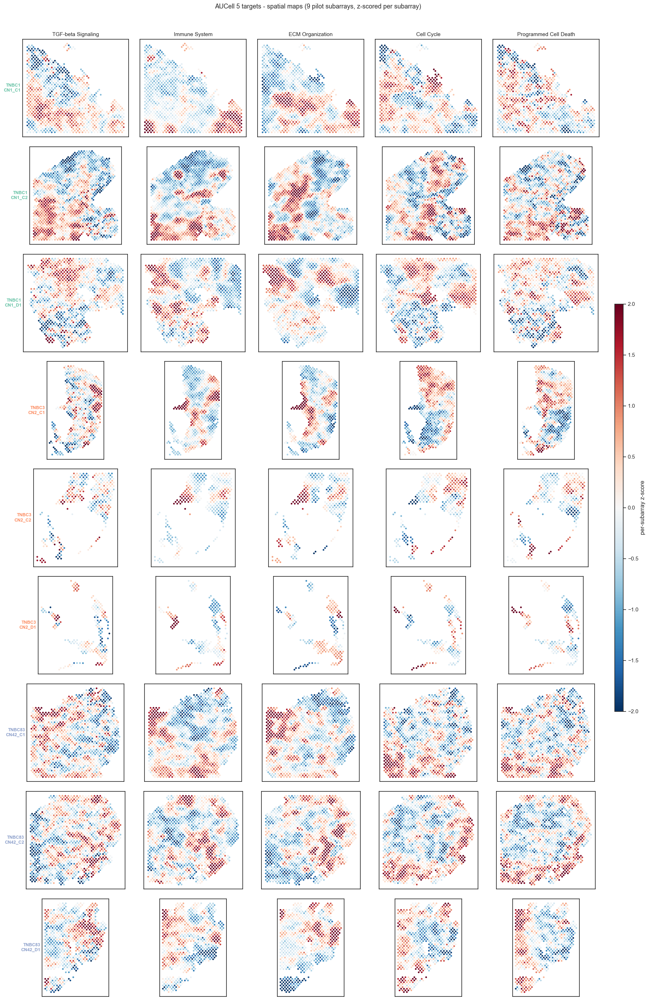

In [3]:
# order pilot subarrays by patient so each patient's subarrays are contiguous
pilot = target[target['patient'].isin(PILOT_PATIENTS)] if PILOT_PATIENTS else target.sample(n=min(2000, len(target)), random_state=42).copy()
pilot_order = (pilot[['subarray', 'patient']]
               .drop_duplicates()
               .sort_values(['patient', 'subarray']))
pilot_subs = pilot_order['subarray'].tolist()
pilot_pats = pilot_order['patient'].tolist()
print(f'pilot: {len(pilot_subs)} subarrays, {len(pilot)} niches')
for sub, pat in zip(pilot_subs, pilot_pats):
    n = (pilot['subarray'] == sub).sum()
    print(f'  TNBC{pat:>3}  {sub}  n_niches={n}')

# patient palette for the row tag
unique_pats = sorted(set(pilot_pats))
pat_color = {p: c for p, c in zip(unique_pats, sns.color_palette('Set2', len(unique_pats)))}

n_subs = len(pilot_subs)
fig, axes = plt.subplots(n_subs, 5, figsize=(20, 3.2 * n_subs))
if n_subs == 1:
    axes = axes[np.newaxis, :]

sc = None
for si, (sub, pat) in enumerate(zip(pilot_subs, pilot_pats)):
    sub_df = pilot[pilot['subarray'] == sub]
    for ci, col in enumerate(TARGET_COLS):
        ax = axes[si, ci]
        z_col = f'{col}_z'
        if z_col not in sub_df.columns:
            ax.set_visible(False)
            continue
        sc = ax.scatter(sub_df['pixel_x'], sub_df['pixel_y'],
                        c=sub_df[z_col], cmap='RdBu_r', vmin=-2, vmax=2,
                        s=12, linewidth=0)
        ax.invert_yaxis()
        ax.set_aspect('equal')
        ax.set_xticks([])
        ax.set_yticks([])
        if si == 0:
            ax.set_title(col.replace('_', ' '), fontsize=11)
    # patient + subarray label on the left, color-tagged
    short = sub.replace(f'TNBC{pat}_', '')
    axes[si, 0].set_ylabel(
        f'TNBC{pat}\n{short}',
        fontsize=9, rotation=0, ha='right', va='center',
        color=pat_color[pat], fontweight='bold',
    )

if sc is not None:
    cbar_ax = fig.add_axes([0.92, 0.3, 0.012, 0.4])
    fig.colorbar(sc, cax=cbar_ax, label='per-subarray z-score')
fig.suptitle(
    f'AUCell 5 targets - spatial maps ({n_subs} pilot subarrays, z-scored per subarray)',
    fontsize=13, y=0.995,
)
plt.subplots_adjust(left=0.08, right=0.9, top=0.96, bottom=0.02, wspace=0.08, hspace=0.1)


### per-niche MAD / mean across the 5 targets

for each niche, compute mean and MAD (median absolute deviation) across the 5 target pathway scores. the MAD/mean ratio is a robust coefficient of variation - high values indicate the niche is dominated by one or two target pathways (concentrated biology); low values indicate the niche is diffusely active (generic or mixed). spatial maps per patient show where that concentration lives.

per-niche mean across 5 targets:
  global median=0.1401  p5=0.1265  p95=0.1528
per-niche MAD across 5 targets:
  global median=0.0179  p5=0.0051  p95=0.0322
per-niche MAD/mean (robust CV):
  global median=0.1287  p5=0.0370  p95=0.2296


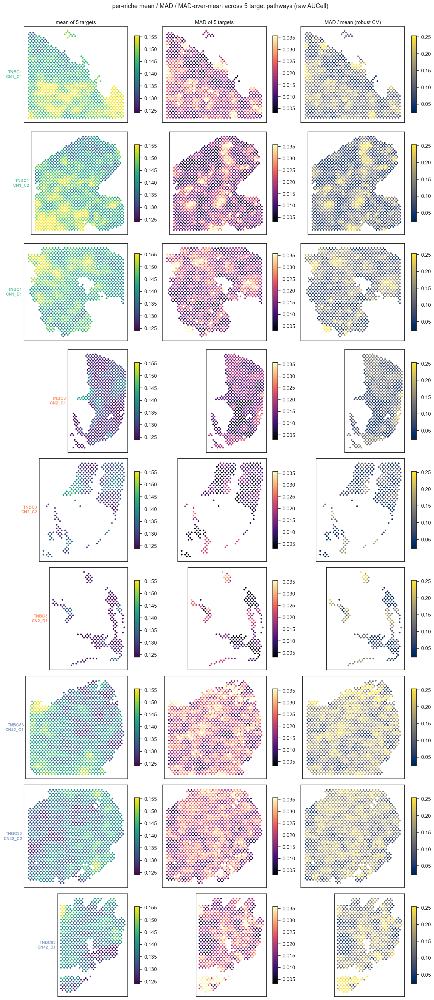


per-patient summary of mad/mean:
         n_niches    median      mean       std
patient                                        
1            3834  0.113529  0.119582  0.057156
3            1249  0.087961  0.093227  0.049311
83           3595  0.158405  0.154863  0.056097


In [4]:
from scipy.stats import median_abs_deviation

# use RAW AUCell scores, not z-scored, so the ratio is meaningful per niche
tgt_mat = pilot[TARGET_COLS].values  # (n_niches, 5)
niche_mean = tgt_mat.mean(axis=1)
niche_mad = median_abs_deviation(tgt_mat, axis=1, scale=1.0)
niche_ratio = niche_mad / (niche_mean + 1e-9)

pilot_plot = pilot.copy()
pilot_plot['niche_mean'] = niche_mean
pilot_plot['niche_mad']  = niche_mad
pilot_plot['mad_over_mean'] = niche_ratio

print('per-niche mean across 5 targets:')
print(f'  global median={np.median(niche_mean):.4f}  p5={np.percentile(niche_mean, 5):.4f}  p95={np.percentile(niche_mean, 95):.4f}')
print('per-niche MAD across 5 targets:')
print(f'  global median={np.median(niche_mad):.4f}  p5={np.percentile(niche_mad, 5):.4f}  p95={np.percentile(niche_mad, 95):.4f}')
print('per-niche MAD/mean (robust CV):')
print(f'  global median={np.median(niche_ratio):.4f}  p5={np.percentile(niche_ratio, 5):.4f}  p95={np.percentile(niche_ratio, 95):.4f}')

# 3 columns: mean, MAD, MAD/mean spatial maps per subarray (grouped by patient)
n_subs = len(pilot_subs)
fig, axes = plt.subplots(n_subs, 3, figsize=(13, 3.3 * n_subs))
if n_subs == 1:
    axes = axes[np.newaxis, :]

# compute shared color ranges so cross-subarray comparison is meaningful
vmin_mean, vmax_mean = np.percentile(niche_mean, [2, 98])
vmin_mad,  vmax_mad  = np.percentile(niche_mad,  [2, 98])
vmin_rat,  vmax_rat  = np.percentile(niche_ratio, [2, 98])

for si, (sub, pat) in enumerate(zip(pilot_subs, pilot_pats)):
    sub_df = pilot_plot[pilot_plot['subarray'] == sub]
    short = sub.replace(f'TNBC{pat}_', '')

    for ci, (col, vmin, vmax, cmap, title) in enumerate([
        ('niche_mean', vmin_mean, vmax_mean, 'viridis',  'mean of 5 targets'),
        ('niche_mad',  vmin_mad,  vmax_mad,  'magma',    'MAD of 5 targets'),
        ('mad_over_mean', vmin_rat, vmax_rat, 'cividis', 'MAD / mean (robust CV)'),
    ]):
        ax = axes[si, ci]
        sc = ax.scatter(sub_df['pixel_x'], sub_df['pixel_y'],
                        c=sub_df[col], cmap=cmap, vmin=vmin, vmax=vmax,
                        s=12, linewidth=0)
        ax.invert_yaxis()
        ax.set_aspect('equal')
        ax.set_xticks([])
        ax.set_yticks([])
        if si == 0:
            ax.set_title(title, fontsize=11)
        if ci == 2:
            plt.colorbar(sc, ax=ax, shrink=0.75, aspect=15)
    axes[si, 0].set_ylabel(
        f'TNBC{pat}\n{short}',
        fontsize=9, rotation=0, ha='right', va='center',
        color=pat_color[pat], fontweight='bold',
    )
    # first two columns share their colorbar with the third's limits - add inline
    for ci in range(2):
        ax = axes[si, ci]
        sc2 = ax.collections[0]
        plt.colorbar(sc2, ax=ax, shrink=0.75, aspect=15)

fig.suptitle('per-niche mean / MAD / MAD-over-mean across 5 target pathways (raw AUCell)',
             fontsize=13, y=0.995)
plt.tight_layout()
plt.show()

# per-patient summary
print('\nper-patient summary of mad/mean:')
summary = (pilot_plot.groupby('patient')['mad_over_mean']
           .agg(['count', 'median', 'mean', 'std'])
           .rename(columns={'count': 'n_niches'}))
print(summary.to_string())

## 3.6 per-niche top-X% MAD/mean -> Fisher EA on TF-filtered Reactome (grouped by top-level parent)

this is the only EA pipeline now. low-level pathway constructs removed.

for each niche independently:
  1. pull the 7-spot submatrix (center + 6 neighbors)
  2. log1p(CPM) per spot -> (7 x n_genes)
  3. per gene: MAD/mean across the 7 spots -> variability score
  4. **automatic threshold**: foreground = top `MAD_TOP_FRACTION` of expressed genes by MAD/mean (default 25%)
     background = `mean > 0`
  5. AUCell on the variable-gene-filtered niche profile against TF-filtered Reactome leaves
  6. Fisher exact + BH-FDR per niche against the **TF-filtered Reactome** test universe
  7. `pathway_adjpvalue = -log10(fdr_bh) / num_pathway`
  8. significant iff `fdr_bh <= FDR_STRICT AND odds_ratio > OR_CUT AND pathway_adjpvalue <= PATHWAY_ADJ_CUT`
  9. **roll up to top-level Reactome parents** via BFS on the parent-of relation; each sig pathway is grouped under its top-level ancestor for display

test universe: ALL human Reactome pathways from `ReactomePathways.gmt`, with each pathway's gene set restricted to TF genes from PathwayCommons v12 (`controls-expression-of`, n=1658). After TF filter, pathways with size 15-500 TF genes are kept.

no hand-picked target parents. no low-level (sbgn-ehld) restriction. no 5-parent restricted universe. just whole Reactome filtered to TF genes, tested per niche, displayed by top-level Reactome category.

In [5]:
# 3.6.A  build TF-filtered Reactome test universe + top-level parent rollup
import zipfile
from collections import defaultdict, deque

REACTOME = ROOT / 'knowledge' / 'reactome'
PATHWAY_COMMONS = ROOT / 'knowledge' / 'pathway_commons'

MAD_TOP_FRACTION = 0.25         # 3.6 per-niche top-X% by MAD/mean
MAD_THRESHOLD = None            # legacy, unused
MIN_PATHWAY_SIZE = 15           # min TF-filtered gene set size
MAX_PATHWAY_SIZE = 500          # max TF-filtered gene set size
MIN_BG = 100
MIN_FG = 20

MIN_NICHE_UMI = 1000       # drop niches with < 1000 total raw UMI
MIN_DETECTED_SPOTS = 3     # drop niches where < 3 of 7 spots have signal
MIN_SPOT_UMI = 200         # signal threshold per spot

FDR_STRICT = 0.05
OR_CUT = 2.0
PATHWAY_ADJ_CUT = 0.05
K_NEIGHBORS = 6
MT_PREFIXES = ('MT-', 'MTRNR')
TOP_N_PARENT_DISPLAY = 12       # show top-N most-frequent top-level parents in print/heatmap

# load TF gene set (PathwayCommons v12 controls-expression-of)
tf_data = json.loads((PATHWAY_COMMONS / 'tf_genes_controls_expression.json').read_text())
TF_GENES = set(tf_data['tf_genes'])
print(f'TF genes (PathwayCommons v12): {len(TF_GENES)}')

# load FULL Reactome gmt for HSA (not just low-level) - filter genes per pathway to TF only
all_reactome = {}
with zipfile.ZipFile(REACTOME / 'ReactomePathways.gmt.zip') as z:
    with z.open(z.namelist()[0]) as f:
        for line in f:
            parts = line.decode('utf8').strip().split('\t')
            if len(parts) >= 3 and parts[1].startswith('R-HSA-'):
                all_reactome[parts[1]] = {'name': parts[0], 'genes': set(parts[2:])}
print(f'all human Reactome pathways: {len(all_reactome)}')

# TF-filter each pathway's gene set
tf_filtered_reactome = {}
for stId, info in all_reactome.items():
    tf_genes_in_path = info['genes'] & TF_GENES
    if MIN_PATHWAY_SIZE <= len(tf_genes_in_path) <= MAX_PATHWAY_SIZE:
        tf_filtered_reactome[stId] = {
            'name': info['name'],
            'genes': tf_genes_in_path,
            'orig_size': len(info['genes']),
        }
print(f'after TF filter (size {MIN_PATHWAY_SIZE}-{MAX_PATHWAY_SIZE}): {len(tf_filtered_reactome)} pathways')

# build child -> parents map for top-level rollup (Reactome is a DAG)
parents_of = defaultdict(set)
all_pathways_in_relation = set()
with open(REACTOME / 'ReactomePathwaysRelation.txt') as f:
    for line in f:
        parts = line.strip().split('\t')
        if len(parts) == 2 and '-HSA' in parts[0]:
            parent, child = parts
            parents_of[child].add(parent)
            all_pathways_in_relation.add(parent)
            all_pathways_in_relation.add(child)

# top-level pathways = those with no parents in the relation
top_level_set = {p for p in all_pathways_in_relation if not parents_of.get(p)}
print(f'top-level Reactome pathways (no parent): {len(top_level_set)}')

# walk up to find top-level ancestor(s) per pathway
def top_ancestors(stId):
    visited = set()
    queue = [stId]
    tops = set()
    while queue:
        cur = queue.pop()
        if cur in visited:
            continue
        visited.add(cur)
        if cur in top_level_set or not parents_of.get(cur):
            tops.add(cur)
        else:
            queue.extend(parents_of[cur])
    return tops


# walk up from a leaf to find the mid-level ancestor under each top parent
# mid-level = the ancestor node whose direct parent is the top-level parent
# (if the leaf is itself a direct child of a top, mid = leaf itself)
def mid_levels_under_top(leaf, top, max_steps=200):
    visited = set()
    stack = [(leaf, 0)]
    mids = set()
    while stack:
        cur, depth = stack.pop()
        if cur in visited or depth > max_steps:
            continue
        visited.add(cur)
        ps = parents_of.get(cur, set())
        if top in ps:
            # cur is a direct child of top -> cur is the mid-level
            mids.add(cur)
        for pp in ps:
            if pp == top:
                continue
            stack.append((pp, depth + 1))
    return mids

# attach top-level + mid-level ancestor names to each leaf in the test universe
LEAVES = {}
n_no_top = 0
for stId, info in tf_filtered_reactome.items():
    tops = top_ancestors(stId)
    if not tops:
        # leaf has no parent - it might itself be a top-level pathway
        tops = {stId}
        n_no_top += 1
    top_names = sorted({all_reactome[t]['name'] for t in tops if t in all_reactome})
    # mid-level under each top: dict {top_name: [mid_names]}
    mid_per_top = {}
    for t in tops:
        if t not in all_reactome: continue
        t_name = all_reactome[t]['name']
        mid_ids = mid_levels_under_top(stId, t)
        if not mid_ids:
            mid_per_top[t_name] = ['(direct)']
        else:
            mid_per_top[t_name] = sorted({all_reactome[m]['name'] for m in mid_ids if m in all_reactome})
    LEAVES[stId] = {
        'name': info['name'],
        'genes': info['genes'],
        'orig_size': info['orig_size'],
        'top_parent_ids': sorted(tops),
        'top_parent_names': top_names,
        'mid_per_top': mid_per_top,
    }

leaf_source_map = {f'{k}|{v["name"][:50]}': v for k, v in LEAVES.items()}
leaf_to_top_parents = {k: v['top_parent_names'] for k, v in leaf_source_map.items()}
leaf_to_mid_per_top = {k: v['mid_per_top'] for k, v in leaf_source_map.items()}
leaf_to_name = {k: v['name'] for k, v in leaf_source_map.items()}

# count leaves per top-level parent (a leaf can belong to multiple top-levels)
top_parent_counts = defaultdict(int)
for v in LEAVES.values():
    for tp in v['top_parent_names']:
        top_parent_counts[tp] += 1

print(f'\nTEST universe (TF-filtered Reactome): {len(LEAVES)} pathways')
print(f'  pathways with no top-level parent (treated as their own top): {n_no_top}')
print(f'\nleaves per top-level Reactome parent (sorted, top {TOP_N_PARENT_DISPLAY}):')
for tp, n in sorted(top_parent_counts.items(), key=lambda kv: -kv[1])[:TOP_N_PARENT_DISPLAY]:
    print(f'  {n:>4}  {tp}')


TF genes (PathwayCommons v12): 1658
all human Reactome pathways: 2855
after TF filter (size 15-500): 546 pathways
top-level Reactome pathways (no parent): 29

TEST universe (TF-filtered Reactome): 546 pathways
  pathways with no top-level parent (treated as their own top): 0

leaves per top-level Reactome parent (sorted, top 12):
   112  Signal Transduction
    85  Disease
    72  Immune System
    65  Gene expression (Transcription)
    47  Cell Cycle
    31  Developmental Biology
    23  Cellular responses to stimuli
    16  Metabolism
    13  Metabolism of proteins
    12  Cell-Cell communication
    11  DNA Repair
    10  Metabolism of RNA


In [6]:
# 3.6.B  per-subarray Rscript loop: build niche profile + var/bg masks for pilot
import io
import re
import subprocess
from sklearn.neighbors import NearestNeighbors

PILOT_PREFIXES = ()  # empty tuple = process ALL 280 subarrays

e2s = pd.read_csv(ROOT / 'data' / 'inputs' / 'ensembl_to_symbol.tsv', sep='\t')
e2s_map = dict(zip(e2s['ensembl_id'], e2s['gene_symbol']))

# global HGNC gene order (drop MT/MTRNR) - same convention as niche_aucell.py
all_hgnc = sorted({s for s in e2s_map.values() if s and not s.startswith(MT_PREFIXES)})
global_gene_order = {s: i for i, s in enumerate(all_hgnc)}
n_global = len(all_hgnc)
print(f'global HGNC universe: {n_global}')

NICHE_DIR = ROOT / 'data' / 'embeddings' / 'virchow2_niche'
BYARRAY  = ROOT / 'data' / 'inputs' / 'byArray'
meta_files = sorted(NICHE_DIR.glob('*_meta.tsv'))
pilot_files = meta_files if not PILOT_PREFIXES else [m for m in meta_files if any(m.stem.startswith(p) for p in PILOT_PREFIXES)]
print(f'pilot: {len(pilot_files)} subarrays')

def process_subarray(mpath):
    stem = mpath.stem.replace('_meta', '')
    parts = stem.split('_', 1)
    patient = int(parts[0].replace('TNBC', ''))
    slide, pos = parts[1].split('_')
    rdata = BYARRAY / slide / pos / 'selection.RData'
    if not rdata.exists():
        return None
    r = subprocess.run(
        ['Rscript', '-e', f'load("{rdata}"); write.table(cnts, stdout(), sep="\\t", quote=FALSE, col.names=NA)'],
        capture_output=True, text=True)
    if r.returncode != 0: return None
    cnts = pd.read_csv(io.StringIO(r.stdout), sep='\t', index_col=0)

    stripped = [re.sub(r'\.\d+$', '', g) for g in cnts.columns]
    keep_local, keep_global = [], []
    seen = set()
    for i, eid in enumerate(stripped):
        sym = e2s_map.get(eid)
        if sym is None or sym in seen or sym.startswith(MT_PREFIXES): continue
        gcol = global_gene_order.get(sym)
        if gcol is None: continue
        seen.add(sym); keep_local.append(i); keep_global.append(gcol)
    keep_local = np.asarray(keep_local); keep_global = np.asarray(keep_global)
    counts_local = cnts.values[:, keep_local].astype(np.float32)

    meta = pd.read_csv(mpath, sep='\t', index_col=0)
    shared = meta.index.intersection(cnts.index)
    meta = meta.loc[shared]
    pos_in_cnts = {sid: i for i, sid in enumerate(cnts.index)}
    row_order = np.array([pos_in_cnts[sid] for sid in meta.index])
    counts_local = counts_local[row_order]
    coords = meta[['pixel_x', 'pixel_y']].values
    is_center = meta['neighbor_count'].values >= 7

    nn = NearestNeighbors(n_neighbors=K_NEIGHBORS + 1).fit(coords)
    _, idx_nn = nn.kneighbors(coords)
    center_rows = np.where(is_center)[0]

    niche_profile_rows, var_rows, bg_rows, md = [], [], [], []
    for ci in center_rows:
        c7 = counts_local[idx_nn[ci, :K_NEIGHBORS + 1]]  # (7, n_local)

        # white-space qc gates
        niche_total_umi = int(c7.sum())
        if niche_total_umi < MIN_NICHE_UMI:
            continue
        n_spots_with_signal = int((c7.sum(axis=1) >= MIN_SPOT_UMI).sum())
        if n_spots_with_signal < MIN_DETECTED_SPOTS:
            continue
        lib = c7.sum(axis=1, keepdims=True) + 1e-9
        norm_7 = np.log1p(c7 / lib * 1e6).astype(np.float32)

        lib = c7.sum(axis=1, keepdims=True) + 1e-9
        norm_7 = np.log1p(c7 / lib * 1e6).astype(np.float32)
        g_mean = norm_7.mean(axis=0)
        g_med = np.median(norm_7, axis=0)
        g_mad = np.median(np.abs(norm_7 - g_med[None, :]), axis=0)
        g_ratio = g_mad / (g_mean + 1e-9)

        bg_local = g_mean > 0
        n_bg_here = int(bg_local.sum())
        if n_bg_here < MIN_BG:
            continue
        # percentile on the NON-ZERO MAD/mean subset only: zero-variance genes are locally constant
        # and uninformative; ranking them introduces arbitrary tie-break noise on zero-inflated 7-spot niches
        nonzero_local = bg_local & (g_ratio > 0)
        n_nonzero = int(nonzero_local.sum())
        if n_nonzero < MIN_FG:
            continue  # truly uninformative niche, skip
        n_keep = max(MIN_FG, int(np.floor(MAD_TOP_FRACTION * n_nonzero)))
        n_keep = min(n_keep, n_nonzero)
        nz_idx = np.where(nonzero_local)[0]
        nz_ratios = g_ratio[nz_idx]
        top_k_local = np.argpartition(-nz_ratios, n_keep - 1)[:n_keep]
        var_idx = nz_idx[top_k_local]
        var_local = np.zeros_like(bg_local)
        var_local[var_idx] = True
        # capture the actual MAD/mean cutoff used for this niche (lowest ratio in selected set)
        niche_cutoff = float(g_ratio[var_idx].min())

        niche_sum = c7.sum(axis=0)
        nz = np.nonzero(niche_sum)[0]
        niche_profile_rows.append((keep_global[nz], niche_sum[nz]))
        var_rows.append(keep_global[np.where(var_local)[0]])
        bg_rows.append(keep_global[np.where(bg_local)[0]])
        md.append({
            'niche_id': f'{stem}::{meta.index[ci]}',
            'subarray': stem,
            'patient': patient,
            'spot_id': str(meta.index[ci]),
            'pixel_x': float(coords[ci, 0]),
            'pixel_y': float(coords[ci, 1]),
            'n_bg': int(bg_local.sum()),
            'n_fg': int(var_local.sum()),
            'fg_frac': float(var_local.sum() / max(bg_local.sum(), 1)),
            'mad_over_mean_median': float(np.median(g_ratio[bg_local])),
            'niche_mad_cutoff': niche_cutoff,
        })
    if not md:
        return None

    n_n = len(md)
    def build_profile(rows_list):
        rs, cs, vs = [], [], []
        for i, (cix, vx) in enumerate(rows_list):
            rs.extend([i] * len(cix)); cs.extend(cix.tolist()); vs.extend(vx.tolist())
        return sp.coo_matrix((np.array(vs, dtype=np.float32), (np.array(rs), np.array(cs))),
                             shape=(n_n, n_global)).tocsr()
    def build_bool(rows_list):
        rs, cs = [], []
        for i, cix in enumerate(rows_list):
            rs.extend([i] * len(cix)); cs.extend(cix.tolist())
        data = np.ones(len(rs), dtype=np.float32)
        return sp.coo_matrix((data, (np.array(rs), np.array(cs))),
                             shape=(n_n, n_global)).tocsr()
    return {
        'profile': build_profile(niche_profile_rows),
        'var_mask': build_bool(var_rows),
        'bg_mask': build_bool(bg_rows),
        'metadata': md,
    }

profile_chunks, var_chunks, bg_chunks, all_md = [], [], [], []
for mpath in pilot_files:
    out = process_subarray(mpath)
    if out is None: continue
    profile_chunks.append(out['profile'])
    var_chunks.append(out['var_mask'])
    bg_chunks.append(out['bg_mask'])
    all_md.extend(out['metadata'])
    print(f"  [{mpath.stem.replace('_meta','')}] niches={out['profile'].shape[0]:>5}  "
          f"avg_fg={np.mean([m['n_fg'] for m in out['metadata']]):>4.0f}  "
          f"avg_bg={np.mean([m['n_bg'] for m in out['metadata']]):>5.0f}")

profile = sp.vstack(profile_chunks, format='csr')
var_mask = sp.vstack(var_chunks, format='csr')
bg_mask  = sp.vstack(bg_chunks, format='csr')
niche_md = pd.DataFrame(all_md).reset_index(drop=True)


global HGNC universe: 41414
pilot: 280 subarrays
  [TNBC10_CN5_D2] niches= 1111  avg_fg= 207  avg_bg= 5819
  [TNBC10_CN5_E1] niches= 1148  avg_fg=  91  avg_bg= 3014
  [TNBC10_CN5_E2] niches= 1209  avg_fg= 177  avg_bg= 4814
  [TNBC11_CN6_C1] niches= 1586  avg_fg= 314  avg_bg= 6482
  [TNBC11_CN6_C2] niches= 1503  avg_fg= 259  avg_bg= 5938
  [TNBC11_CN6_D1] niches= 1797  avg_fg= 308  avg_bg= 6165
  [TNBC12_CN6_D2] niches=  729  avg_fg= 475  avg_bg= 8494
  [TNBC12_CN6_E1] niches=  937  avg_fg= 431  avg_bg= 7918
  [TNBC12_CN6_E2] niches= 1009  avg_fg= 472  avg_bg= 8648
  [TNBC13_CN7_C1] niches= 1184  avg_fg= 247  avg_bg= 5526
  [TNBC13_CN7_C2] niches=  630  avg_fg= 176  avg_bg= 4516
  [TNBC13_CN7_D1] niches= 1220  avg_fg= 236  avg_bg= 5323
  [TNBC14_CN7_D2] niches=  579  avg_fg=1049  avg_bg=10296
  [TNBC14_CN7_E1] niches=  715  avg_fg= 738  avg_bg= 8586
  [TNBC14_CN7_E2] niches=  461  avg_fg=1146  avg_bg=10621
  [TNBC15_CN8_C1] niches= 1238  avg_fg= 651  avg_bg= 8291
  [TNBC15_CN8_C2] niche

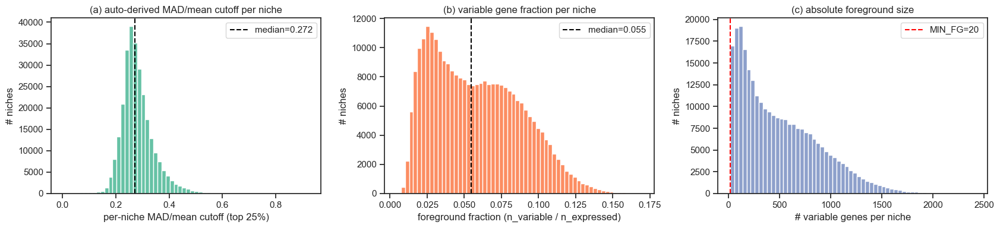


niche_mad_cutoff:  median=0.272  p5=0.201  p95=0.397
fg_frac:           median=0.055  p5=0.018  p95=0.110
n_fg:              median=417  p5=52  p95=1240

to change the percentile: edit MAD_TOP_FRACTION in cell 23, re-run cells 24 -> 25 -> ...


In [7]:
# 3.6.B.2  inspect the auto-derived per-niche MAD/mean cutoffs and resulting fg sizes
# under percentile-based selection, each niche has its OWN cutoff (the MAD/mean value at the top X% boundary)

fig, axes = plt.subplots(1, 3, figsize=(17, 4))
axes[0].hist(niche_md['niche_mad_cutoff'], bins=60, color=palette[0])
axes[0].axvline(niche_md['niche_mad_cutoff'].median(), ls='--', color='k',
                label=f'median={niche_md["niche_mad_cutoff"].median():.3f}')
axes[0].set_xlabel(f'per-niche MAD/mean cutoff (top {int(MAD_TOP_FRACTION*100)}%)')
axes[0].set_ylabel('# niches')
axes[0].set_title('(a) auto-derived MAD/mean cutoff per niche')
axes[0].legend()

axes[1].hist(niche_md['fg_frac'], bins=60, color=palette[1])
axes[1].axvline(niche_md['fg_frac'].median(), ls='--', color='k',
                label=f'median={niche_md["fg_frac"].median():.3f}')
axes[1].set_xlabel('foreground fraction (n_variable / n_expressed)')
axes[1].set_ylabel('# niches')
axes[1].set_title('(b) variable gene fraction per niche')
axes[1].legend()

axes[2].hist(niche_md['n_fg'], bins=60, color=palette[2])
axes[2].axvline(MIN_FG, ls='--', color='red', label=f'MIN_FG={MIN_FG}')
axes[2].set_xlabel('# variable genes per niche')
axes[2].set_ylabel('# niches')
axes[2].set_title('(c) absolute foreground size')
axes[2].legend()
plt.tight_layout()
plt.show()

print(f'\nniche_mad_cutoff:  median={niche_md["niche_mad_cutoff"].median():.3f}  '
      f'p5={np.percentile(niche_md["niche_mad_cutoff"], 5):.3f}  '
      f'p95={np.percentile(niche_md["niche_mad_cutoff"], 95):.3f}')
print(f'fg_frac:           median={niche_md["fg_frac"].median():.3f}  '
      f'p5={np.percentile(niche_md["fg_frac"], 5):.3f}  '
      f'p95={np.percentile(niche_md["fg_frac"], 95):.3f}')
print(f'n_fg:              median={int(niche_md["n_fg"].median())}  '
      f'p5={int(np.percentile(niche_md["n_fg"], 5))}  '
      f'p95={int(np.percentile(niche_md["n_fg"], 95))}')
print(f'\nto change the percentile: edit MAD_TOP_FRACTION in cell 23, re-run cells 24 -> 25 -> ...')

In [8]:
# 3.6.C  AUCell on variable-gene-filtered niches + Fisher EA on TF-filtered Reactome
import anndata as ad
import decoupler as dc
from scipy.stats import hypergeom
from statsmodels.stats.multitest import multipletests

# --- AUCell on zero-masked niches ---
profile_filtered = profile.multiply(var_mask).tocsr()
lib = np.asarray(profile_filtered.sum(axis=1)).ravel()
scaling = 1e4 / np.maximum(lib, 1)
Xn = profile_filtered.multiply(scaling[:, None]).tocsr()
Xn.data = np.log1p(Xn.data)

adata = ad.AnnData(X=Xn, obs=niche_md.copy(), var=pd.DataFrame(index=np.array(all_hgnc)))
adata.obs_names_make_unique()

net_rows = []
for src, info in leaf_source_map.items():
    for g in info['genes']:
        net_rows.append({'source': src, 'target': g})
net_df = pd.DataFrame(net_rows)
print(f'AUCell net: {net_df["source"].nunique()} TF-filtered Reactome leaves, {len(net_df)} edges')

dc.mt.aucell(adata, net=net_df, tmin=MIN_PATHWAY_SIZE, verbose=False)
leaf_scores = adata.obsm['score_aucell'].copy()
print(f'leaf_scores: {leaf_scores.shape}')

# --- Fisher EA: fixed universe = union of TF-filtered Reactome genes ---
universe_symbols = set()
for info in LEAVES.values():
    universe_symbols |= info['genes']
universe_cols = set()
for sym in universe_symbols:
    gi = global_gene_order.get(sym)
    if gi is not None:
        universe_cols.add(gi)
N_universe = len(universe_cols)
print(f'fixed EA universe: {N_universe} TF genes (union across TF-filtered leaves)')

leaf_gene_cols = {}
for src, info in leaf_source_map.items():
    pcols = set()
    for g in info['genes']:
        gi = global_gene_order.get(g)
        if gi is not None and gi in universe_cols:
            pcols.add(gi)
    if len(pcols) >= MIN_PATHWAY_SIZE:
        leaf_gene_cols[src] = pcols
leaf_sources = list(leaf_gene_cols.keys())
num_pathway = len(leaf_sources)
print(f'leaves testable in universe (size >= {MIN_PATHWAY_SIZE}): {num_pathway}')

per_niche_top_parent_counts = []
sig_rows_all = []
n_niches = niche_md.shape[0]
for i in range(n_niches):
    fg = set(var_mask[i].indices.tolist()) & universe_cols
    K = len(fg)
    if K < MIN_FG:
        per_niche_top_parent_counts.append({})
        continue
    rows = []
    for src in leaf_sources:
        pset = leaf_gene_cols[src]; M = len(pset); x = len(pset & fg)
        pval = float(hypergeom.sf(x - 1, N_universe, M, K))
        a, b, c, d = x, K - x, M - x, N_universe - M - K + x
        if b > 0 and c > 0: odds = (a * d) / max(b * c, 1e-12)
        elif a > 0 and (b == 0 or c == 0): odds = 1e9
        else: odds = 0.0
        rows.append({'src': src, 'pathway_name': leaf_to_name[src],
                     'top_parents': leaf_to_top_parents[src],
                     'mid_per_top': leaf_to_mid_per_top[src],
                     'odds_ratio': float(odds), 'pvalue': pval, 'n_overlap': int(x),
                     'n_pathway': int(M), 'n_fg': int(K)})
    if not rows:
        per_niche_top_parent_counts.append({})
        continue
    df = pd.DataFrame(rows)
    _, fdrs, _, _ = multipletests(df['pvalue'].values, alpha=0.05, method='fdr_bh')
    df['fdr_bh'] = fdrs
    df['pathway_adjpvalue'] = -np.log10(np.clip(df['fdr_bh'].values, 1e-300, None)) / num_pathway
    df['sig'] = (df['fdr_bh'] <= FDR_STRICT) & (df['odds_ratio'] > OR_CUT)  # textbook two-gate; pathway_adjpvalue dropped (non-standard, over-aggressive on small-K niches)
    sig = df[df['sig']]
    # tally per top-level parent (a sig leaf contributes to each of its top parents)
    tp_counts = defaultdict(int)
    for _, r in sig.iterrows():
        for tp in r['top_parents']:
            tp_counts[tp] += 1
    per_niche_top_parent_counts.append(dict(tp_counts))
    if len(sig):
        s = sig.copy(); s['niche_id'] = niche_md.iloc[i]['niche_id']; s['subarray'] = niche_md.iloc[i]['subarray']
        sig_rows_all.append(s)

# pick top N most-frequent top-level parents across ALL niches for display
global_tp_freq = defaultdict(int)
for d in per_niche_top_parent_counts:
    for tp, c in d.items():
        global_tp_freq[tp] += c
top_parents_display = [tp for tp, _ in sorted(global_tp_freq.items(), key=lambda kv: -kv[1])[:TOP_N_PARENT_DISPLAY]]
print(f'\ntop {len(top_parents_display)} most-frequent top-level parents (sig hits across pilot):')
for tp in top_parents_display:
    print(f'  {global_tp_freq[tp]:>5}  {tp}')

# build per-niche per-top-parent sig count matrix for the top N parents
sig_counts_df = pd.DataFrame([{tp: d.get(tp, 0) for tp in top_parents_display} for d in per_niche_top_parent_counts])

results = niche_md.copy()
for tp in top_parents_display:
    safe = tp.replace(' ', '_').replace('/', '_').replace('-', '_')[:30]
    results[f'sig_{safe}'] = sig_counts_df[tp].values
results['sig_total'] = sig_counts_df.sum(axis=1).values
results['_top_parents_display'] = [list(top_parents_display)] * len(results)  # so cell 28 can read this

print('\n=== SUMMARY ===')
print(f'criteria: fdr_bh <= {FDR_STRICT}  AND  odds_ratio > {OR_CUT}  AND  pathway_adjpvalue <= {PATHWAY_ADJ_CUT}')
for tp in top_parents_display:
    safe = tp.replace(' ', '_').replace('/', '_').replace('-', '_')[:30]
    sig_arr = results[f'sig_{safe}'].values
    print(f'  {tp[:30]:<32}  mean_sig_per_niche={sig_arr.mean():.3f}  niches_with_any_sig={int((sig_arr > 0).sum())}/{len(sig_arr)}')

print('\nper-patient:')
pp = results.groupby('patient').agg(n_niches=('niche_id', 'count'), mean_fg_frac=('fg_frac', 'mean'), mean_sig_total=('sig_total', 'mean'))


AUCell net: 546 TF-filtered Reactome leaves, 23621 edges
leaf_scores: (278977, 524)
fixed EA universe: 1441 TF genes (union across TF-filtered leaves)
leaves testable in universe (size >= 15): 546

top 12 most-frequent top-level parents (sig hits across pilot):
  88594  Disease
  40199  Gene expression (Transcription)
  36758  Metabolism of RNA
  26712  Signal Transduction
  22520  Cell Cycle
  20091  Immune System
  11413  Cellular responses to stimuli
   7334  Developmental Biology
   6902  Chromatin organization
   4532  DNA Repair
   3294  DNA Replication
   3205  Cell-Cell communication

=== SUMMARY ===
criteria: fdr_bh <= 0.05  AND  odds_ratio > 2.0  AND  pathway_adjpvalue <= 0.05
  Disease                           mean_sig_per_niche=0.318  niches_with_any_sig=16364/278977
  Gene expression (Transcription    mean_sig_per_niche=0.144  niches_with_any_sig=10466/278977
  Metabolism of RNA                 mean_sig_per_niche=0.132  niches_with_any_sig=8167/278977
  Signal Transductio

In [9]:
# 3.6.C.1  persist full-dataset results to parquet so downstream cells / sessions skip the Rscript + Fisher loops

OUT_RESULTS  = BIO / 'niche_fisher_full_results.parquet'
OUT_SIG_ROWS = BIO / 'niche_fisher_full_sig_rows.parquet'
OUT_LEAVES   = BIO / 'niche_fisher_full_leaves.json'

# results: per-niche metadata + sig counts per top-level parent
# columns [niche_id, subarray, patient, spot_id, pixel_x, pixel_y, n_bg, n_fg, fg_frac, niche_mad_cutoff, sig_<parent>...]
results_save = results.drop(columns=['_top_parents_display'], errors='ignore').copy()
results_save.to_parquet(OUT_RESULTS)
print(f'saved results: {OUT_RESULTS.relative_to(ROOT)}  ({len(results_save)} niches)')

# sig rows (flat table of all significant pathway hits per niche)
if sig_rows_all:
    sig_flat = pd.concat(sig_rows_all, ignore_index=True)
    # convert list columns to string for parquet compatibility
    sig_flat['top_parents'] = sig_flat['top_parents'].apply(lambda L: '|'.join(L) if isinstance(L, list) else str(L))
    sig_flat['mid_per_top'] = sig_flat['mid_per_top'].apply(json.dumps)
    sig_flat.to_parquet(OUT_SIG_ROWS)
    print(f'saved sig rows: {OUT_SIG_ROWS.relative_to(ROOT)}  ({len(sig_flat)} rows)')

# also save the leaf metadata for reference (leaf -> top/mid parents + name + gene count)
leaves_save = {
    stId: {
        'name': v['name'],
        'n_genes_tf_filtered': len(v['genes']),
        'orig_size': v.get('orig_size'),
        'top_parent_names': v.get('top_parent_names', []),
        'mid_per_top': v.get('mid_per_top', {}),
    }
    for stId, v in LEAVES.items()
}
OUT_LEAVES.write_text(json.dumps(leaves_save, indent=1))
print(f'saved leaves: {OUT_LEAVES.relative_to(ROOT)}  ({len(leaves_save)} leaves)')

print(f'\ntop-level parents in display:')
for tp in top_parents_display:
    print(f'  {tp}')

saved results: data/embeddings/biological_signals/niche_fisher_full_results.parquet  (278977 niches)
saved sig rows: data/embeddings/biological_signals/niche_fisher_full_sig_rows.parquet  (276421 rows)
saved leaves: data/embeddings/biological_signals/niche_fisher_full_leaves.json  (546 leaves)

top-level parents in display:
  Disease
  Gene expression (Transcription)
  Metabolism of RNA
  Signal Transduction
  Cell Cycle
  Immune System
  Cellular responses to stimuli
  Developmental Biology
  Chromatin organization
  DNA Repair
  DNA Replication
  Cell-Cell communication


In [10]:
# 3.6.C.2  significant pathways grouped by TOP-LEVEL Reactome parent + MID-LEVEL sub-category

if not sig_rows_all:
    print('no significant pathways at current thresholds')
else:
    all_sig = pd.concat(sig_rows_all, ignore_index=True)
    print(f'total sig rows: {len(all_sig)}  unique pathways: {all_sig["pathway_name"].nunique()}')
    print(f'niches with any sig hit: {all_sig["niche_id"].nunique()}/{len(niche_md)}')
    print(f'criteria: fdr_bh <= {FDR_STRICT}  AND  odds_ratio > {OR_CUT}  AND  pathway_adjpvalue <= {PATHWAY_ADJ_CUT}')

    for tp in top_parents_display:
        # all sig rows whose top_parents include this top
        mask = all_sig['top_parents'].apply(lambda L: tp in L)
        sub = all_sig[mask]
        if len(sub) == 0:
            print(f'\n{"=" * 78}')
            print(f'{tp}  (no sig hits)')
            print('=' * 78)
            continue
        print(f'\n{"=" * 78}')
        print(f'{tp}  ({len(sub)} sig rows, {sub["pathway_name"].nunique()} unique pathways)')
        print('=' * 78)

        # for each row, get its mid-level parents UNDER tp (a list, possibly multiple)
        rows_mid = []
        for _, r in sub.iterrows():
            mids_under_tp = r['mid_per_top'].get(tp, ['(direct)'])
            for mid in mids_under_tp:
                rows_mid.append({
                    'mid_category': mid,
                    'pathway_name': r['pathway_name'],
                    'niche_id': r['niche_id'],
                    'fdr_bh': r['fdr_bh'],
                    'odds_ratio': r['odds_ratio'],
                    'n_overlap': r['n_overlap'],
                })
        sub_mid = pd.DataFrame(rows_mid)

        # group by mid_category, count unique pathways and sig rows
        mid_summary = (sub_mid.groupby('mid_category')
                              .agg(n_sig_rows=('pathway_name', 'size'),
                                   n_unique_pathways=('pathway_name', 'nunique'),
                                   n_niches=('niche_id', 'nunique'))
                              .sort_values('n_sig_rows', ascending=False))
        # iterate mid categories in order of frequency
        for mid_name, mid_row in mid_summary.iterrows():
            print(f'\n  -- {mid_name}  ({int(mid_row["n_sig_rows"])} rows, {int(mid_row["n_unique_pathways"])} pathways, {int(mid_row["n_niches"])} niches)')
            mid_paths = sub_mid[sub_mid['mid_category'] == mid_name]
            agg = (mid_paths.groupby('pathway_name')
                            .agg(n_niches=('niche_id', 'nunique'),
                                 min_fdr=('fdr_bh', 'min'),
                                 median_or=('odds_ratio', 'median'),
                                 median_overlap=('n_overlap', 'median'))
                            .sort_values('n_niches', ascending=False)
                            .head(10))  # top 10 pathways per mid category
            agg['min_fdr'] = agg['min_fdr'].apply(lambda x: f'{x:.2e}')
            agg['median_or'] = agg['median_or'].apply(lambda x: f'{x:.1f}')
            agg['median_overlap'] = agg['median_overlap'].astype(int)
            agg.index = ['     ' + n[:64] for n in agg.index]
            print(agg.to_string())

total sig rows: 276421  unique pathways: 530
niches with any sig hit: 35376/278977
criteria: fdr_bh <= 0.05  AND  odds_ratio > 2.0  AND  pathway_adjpvalue <= 0.05

Disease  (88594 sig rows, 83 unique pathways)

  -- Infectious disease  (69450 rows, 43 pathways, 13377 niches)
                                                               n_niches   min_fdr median_or  median_overlap
Dengue Virus-Host Interactions                                     5852  4.51e-08       6.6               8
Infectious disease                                                 5359  3.50e-07       2.9              25
Dengue Virus Infection                                             5106  2.12e-07       5.8               9
Viral Infection Pathways                                           4072  1.06e-06       3.0              22
Abortive elongation of HIV-1 transcript in the absence of Tat      3545  5.78e-07      10.8               5
Pausing and recovery of Tat-mediated HIV elongation                3401  2.4

Text(0.5, 1.01, 'Fisher sig per top-level Reactome parent  (TF-filtered, fdr<=0.05, OR>2.0, pathway_adj<=0.05)')

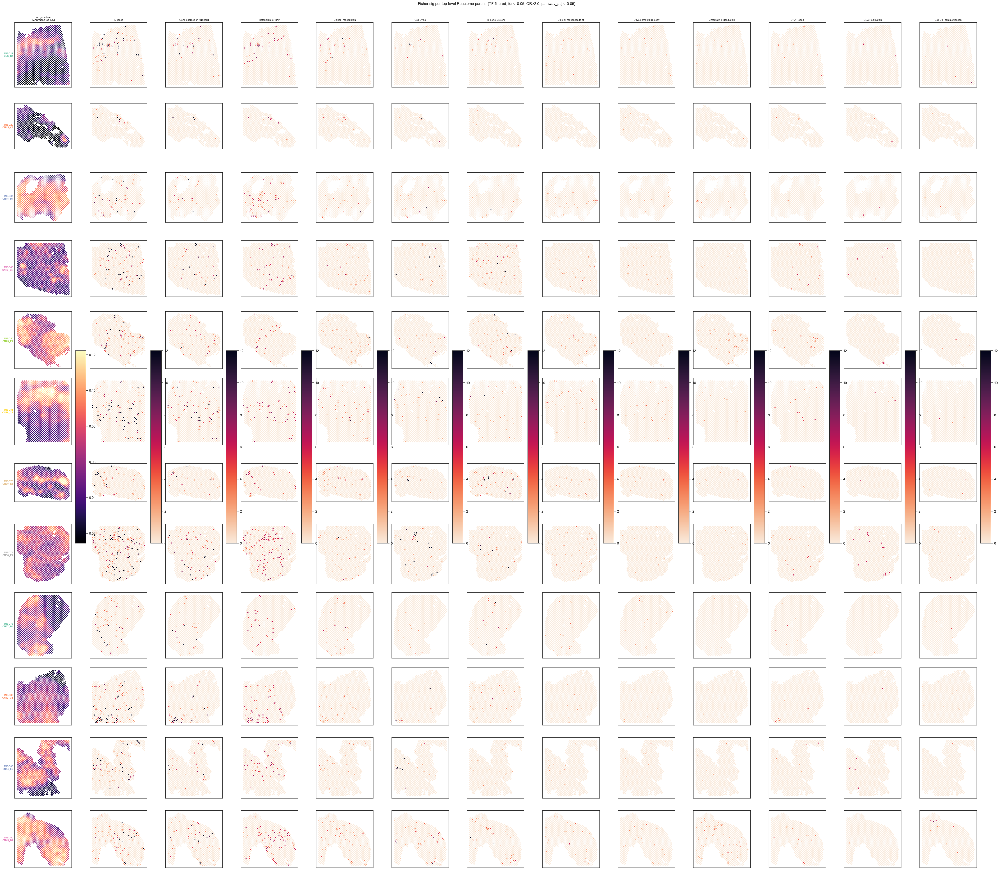

In [11]:
# 3.6.D  spatial heatmaps: MAD/mean + Fisher sig count per top-level Reactome parent

# sample DISPLAY_N subarrays for visualization (280 rows would be unreadable)
DISPLAY_N = 12
rng = np.random.RandomState(42)
pilot_order = results[['subarray', 'patient']].drop_duplicates().sort_values(['patient', 'subarray'])
if len(pilot_order) > DISPLAY_N:
    pilot_order = pilot_order.sample(n=DISPLAY_N, random_state=42).sort_values(['patient', 'subarray']).reset_index(drop=True)
subs = pilot_order['subarray'].tolist()
pats = pilot_order['patient'].tolist()
unique_pats = sorted(set(pats))
pat_c = {pp: c for pp, c in zip(unique_pats, sns.color_palette('Set2', len(unique_pats)))}
n_subs = len(subs)
vmin_mad, vmax_mad = np.percentile(results['fg_frac'], [2, 98])

n_tp = len(top_parents_display)
n_cols = 1 + n_tp
fig, axes = plt.subplots(n_subs, n_cols, figsize=(3.4 * n_cols, 3.2 * n_subs))
if n_subs == 1: axes = axes[np.newaxis, :]

# safe column lookup
safe_cols = {tp: f'sig_{tp.replace(" ", "_").replace("/", "_").replace("-", "_")[:30]}' for tp in top_parents_display}
sig_mat = results[[safe_cols[tp] for tp in top_parents_display]].values
vmax_sig = max(1, int(np.percentile(sig_mat[sig_mat > 0], 95))) if (sig_mat > 0).any() else 1

last_sc = [None] * n_cols
for si, (sub, pat) in enumerate(zip(subs, pats)):
    sdf = results[results['subarray'] == sub]
    short = sub.replace(f'TNBC{pat}_', '')
    ax = axes[si, 0]
    sc = ax.scatter(sdf['pixel_x'], sdf['pixel_y'], c=sdf['fg_frac'],
                    cmap='magma', vmin=vmin_mad, vmax=vmax_mad, s=12, linewidth=0)
    last_sc[0] = sc
    ax.invert_yaxis(); ax.set_aspect('equal'); ax.set_xticks([]); ax.set_yticks([])
    if si == 0:
        ax.set_title('var gene frac\n(MAD/mean top-X%)', fontsize=8)
    ax.set_ylabel(f'TNBC{pat}\n{short}', fontsize=8, rotation=0, ha='right', va='center',
                  color=pat_c[pat], fontweight='bold')
    for ci, tp in enumerate(top_parents_display):
        ax = axes[si, ci + 1]
        sc = ax.scatter(sdf['pixel_x'], sdf['pixel_y'], c=sdf[safe_cols[tp]],
                        cmap='rocket_r', vmin=0, vmax=vmax_sig, s=12, linewidth=0)
        last_sc[ci + 1] = sc
        ax.invert_yaxis(); ax.set_aspect('equal'); ax.set_xticks([]); ax.set_yticks([])
        if si == 0:
            ax.set_title(tp[:25], fontsize=8)
plt.tight_layout()
for ci, sc in enumerate(last_sc):
    if sc is not None: plt.colorbar(sc, ax=axes[:, ci], shrink=0.6, aspect=18)
fig.suptitle(
    f'Fisher sig per top-level Reactome parent  (TF-filtered, fdr<={FDR_STRICT}, OR>{OR_CUT}, pathway_adj<={PATHWAY_ADJ_CUT})',
    fontsize=12, y=1.01,
)


## correlation: per-niche Fisher sig count per top-level Reactome parent vs Wang's mc_weights

**what this is**: for each niche, we count how many significant Fisher EA pathway hits fall under each top-level Reactome parent (e.g. Signal Transduction = 12, Immune System = 5, Metabolism = 3). Then we Pearson-correlate that per-niche count against each of Wang's 14 mc_weights factors across all ~8,700 pilot niches.

**what it tests**: does the Fisher EA's pathway category signal recapitulate Wang's NMF factor structure? If the heatmap shows clean positive blocks where biology agrees (e.g. Immune System ↑ in mc7/mc9, ECM Organization ↑ in mc10/mc13/mc14), the EA pipeline is detecting the same biology as Wang's NMF on real ST counts → biological sanity check passed.

### Wang 2024 megacluster reference

annotations from `data/inputs/misc/megaclusters_characterization.xlsx`:

| factor | TNBC subtype | main biology |
|---|---|---|
| mc1  | BL          | high proliferation, NOTCH/Wnt/TGFβ |
| mc2  | BL          | proliferation, glycolysis, immune depletion |
| mc3  | M, BL       | proliferation, hypoxia, NOTCH |
| mc4  | M           | low PI3K/AKT/mTOR, low metabolism, immune depletion |
| mc5  | BL, IM      | high PI3K/AKT/mTOR, proliferation, immune activation |
| mc6  | M, BL       | high PI3K/AKT/mTOR, NOTCH, hormone-related, proliferation |
| mc7  | IM          | immune activation, HRD, apoptosis |
| mc8  | LAR         | high PI3K/AKT/mTOR, hormone-related, metabolism, adipose |
| mc9  | IM          | immune activation, **TLS** (tertiary lymphoid structures), low angiogenesis |
| mc10 | MSL, IM     | stroma + immune activation, angiogenesis, EMT |
| mc11 | M, MSL      | stroma activation, high angiogenesis, EMT (CD73) |
| mc12 | M           | high myogenesis, low metabolism, immune depletion |
| mc13 | M, MSL      | stroma activation, hormone-related (ESR1) |
| mc14 | MSL         | stroma activation, TGFβ signaling, angiogenesis, adipogenesis |

**TNBC subtypes**:
- **BL**  = Basal-Like
- **M**   = Mesenchymal
- **MSL** = Mesenchymal Stem-Like
- **LAR** = Luminal Androgen Receptor
- **IM**  = Immunomodulatory

**expected biological correlations** (sanity checks):

| Reactome top-level parent | should correlate ↑ with | rationale |
|---|---|---|
| Immune System            | mc7, mc9, mc5            | IM-subtype + immune activation MCs |
| Cell Cycle               | mc1, mc2, mc3, mc5, mc6  | proliferation-driven MCs |
| Extracellular matrix organization | mc10, mc11, mc13, mc14   | M/MSL stromal MCs |
| Signal Transduction      | mc5, mc6, mc8, mc14      | high-signaling MCs (PI3K/mTOR, NOTCH, TGFβ) |
| Metabolism               | mc8, mc12 (low)          | LAR metabolism vs M low-metabolism |
| Programmed Cell Death    | mc7, mc9                 | IM apoptosis-active MCs |

**reciprocal correlations expected**: immune-hot MCs (mc7, mc9) should be ECM-poor (negative r with ECM Organization) and vice versa. Stromal MCs (mc10-14) should be immune-cold.

Fisher results <> mc_weights join: 226780 / 278977 niches


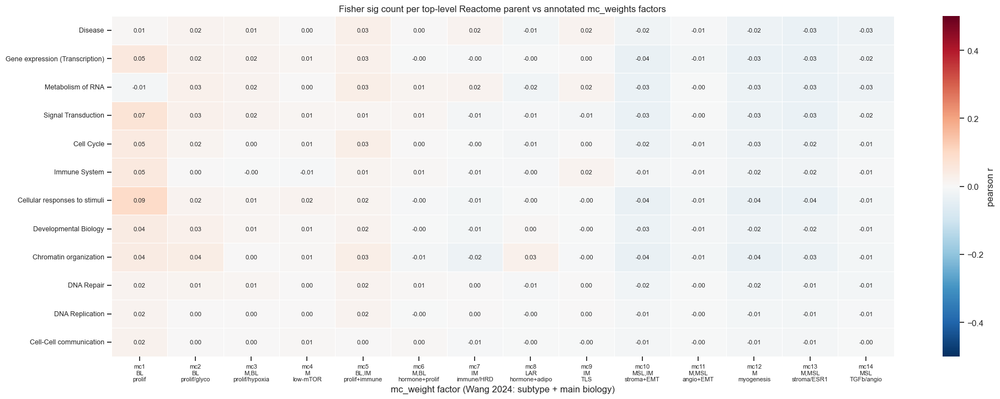

In [12]:
# correlate per-niche Fisher sig count per top-level Reactome parent against mc_weights
# x-axis: Wang's mc_weights factors annotated with TNBC subtype + main biology (megaclusters_characterization.xlsx)

# Wang et al. 2024 megacluster annotations - TNBC subtype + main biology
# source: data/inputs/misc/megaclusters_characterization.xlsx
MC_LABELS = {
    'mc1':  'mc1\nBL\nprolif',
    'mc2':  'mc2\nBL\nprolif/glyco',
    'mc3':  'mc3\nM,BL\nprolif/hypoxia',
    'mc4':  'mc4\nM\nlow-mTOR',
    'mc5':  'mc5\nBL,IM\nprolif+immune',
    'mc6':  'mc6\nM,BL\nhormone+prolif',
    'mc7':  'mc7\nIM\nimmune/HRD',
    'mc8':  'mc8\nLAR\nhormone+adipo',
    'mc9':  'mc9\nIM\nTLS',
    'mc10': 'mc10\nMSL,IM\nstroma+EMT',
    'mc11': 'mc11\nM,MSL\nangio+EMT',
    'mc12': 'mc12\nM\nmyogenesis',
    'mc13': 'mc13\nM,MSL\nstroma/ESR1',
    'mc14': 'mc14\nMSL\nTGFb/angio',
}

mcw = pd.read_csv(BIO / 'mc_weights.tsv', sep='\t')
mcw['key'] = mcw['subarray'].astype(str) + '::' + mcw['spot_id'].astype(str)
mcw_cols = [c for c in mcw.columns if c not in ('subarray', 'spot_id', 'patient_id', 'key')]

def join_to_mcw(df_with_subarray):
    d = df_with_subarray.copy()
    d['subarray_short'] = d['subarray'].str.replace(r'^TNBC\d+_', '', regex=True)
    d['key'] = d['subarray_short'] + '::' + d['spot_id'].astype(str)
    return d.merge(mcw[['key'] + mcw_cols], on='key', how='inner')

if 'results' in dir() and 'top_parents_display' in dir():
    j = join_to_mcw(results)
    print(f'Fisher results <> mc_weights join: {len(j)} / {len(results)} niches')
    safe_cols = {tp: f'sig_{tp.replace(" ", "_").replace("/", "_").replace("-", "_")[:30]}' for tp in top_parents_display}

    # build correlation matrix
    corr_mat = pd.DataFrame(index=top_parents_display, columns=mcw_cols, dtype=float)
    for tp in top_parents_display:
        col = safe_cols[tp]
        for m in mcw_cols:
            corr_mat.loc[tp, m] = j[col].corr(j[m])

    # rename columns with annotated labels (subtype + main biology)
    corr_mat = corr_mat.rename(columns={m: MC_LABELS.get(m, m) for m in mcw_cols})

    fig, ax = plt.subplots(figsize=(20, max(5, 0.45 * len(top_parents_display) + 2)))
    sns.heatmap(corr_mat.astype(float), cmap='RdBu_r', center=0, vmin=-0.5, vmax=0.5,
                annot=True, fmt='.2f', cbar_kws={'label': 'pearson r'},
                ax=ax, linewidths=0.4, annot_kws={'fontsize': 8})
    ax.set_title('Fisher sig count per top-level Reactome parent vs annotated mc_weights factors')
    ax.set_xlabel('mc_weight factor (Wang 2024: subtype + main biology)')
    plt.setp(ax.get_xticklabels(), rotation=0, ha='center', fontsize=8)
    plt.setp(ax.get_yticklabels(), fontsize=9)
    plt.tight_layout()
    plt.show()
else:
    print('run section 3.6 first to populate `results` and `top_parents_display`')